In [1]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

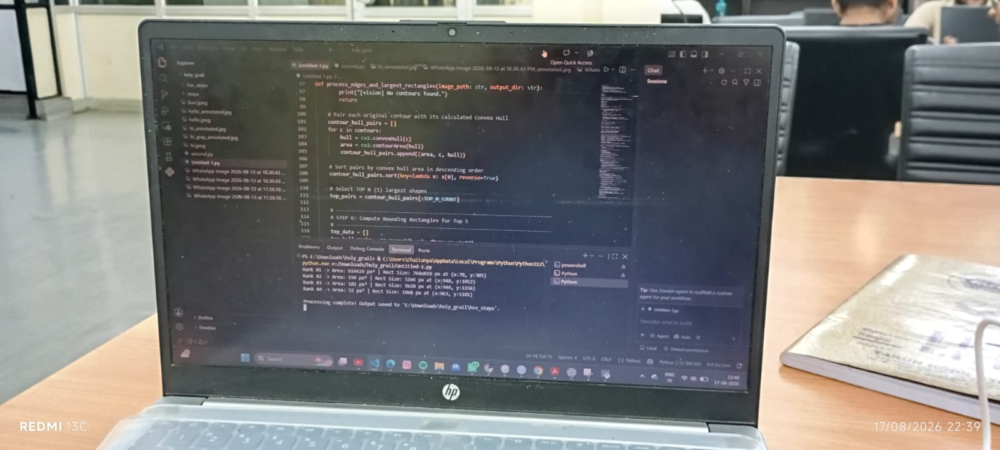

In [2]:
img = cv.imread("/content/img.jpeg")

cv2_imshow(img)

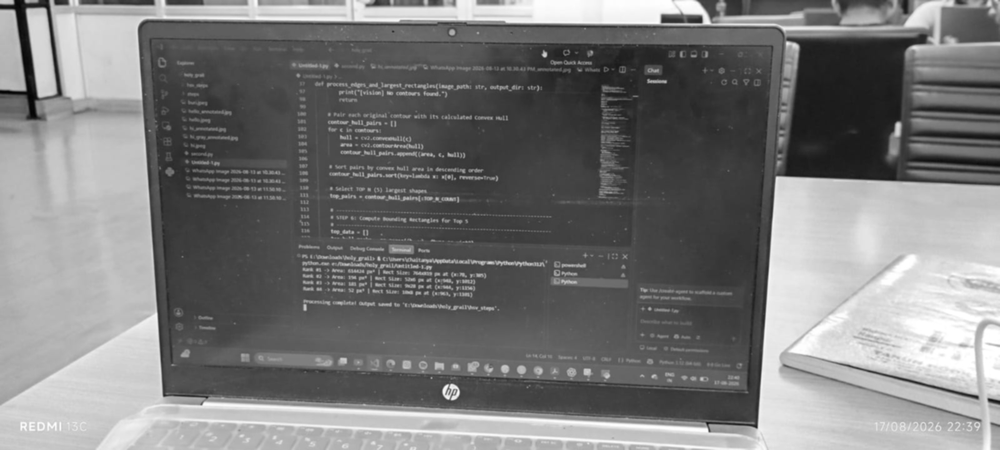

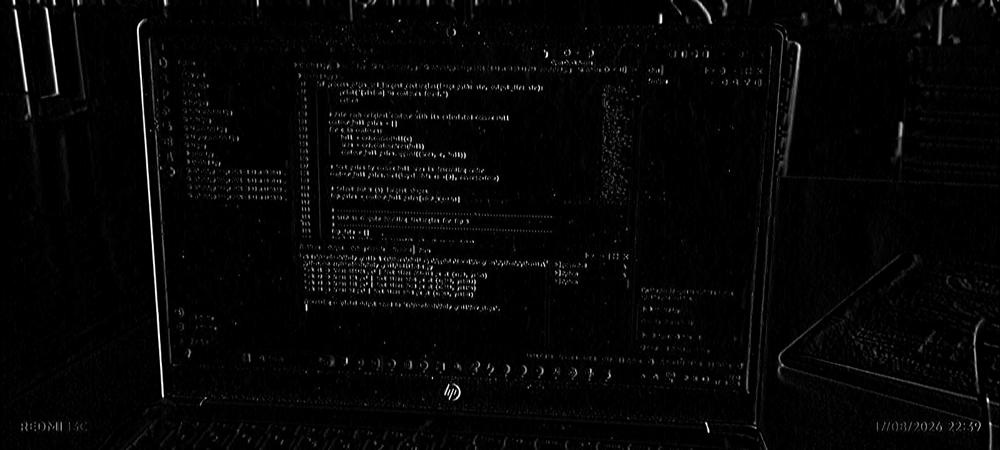

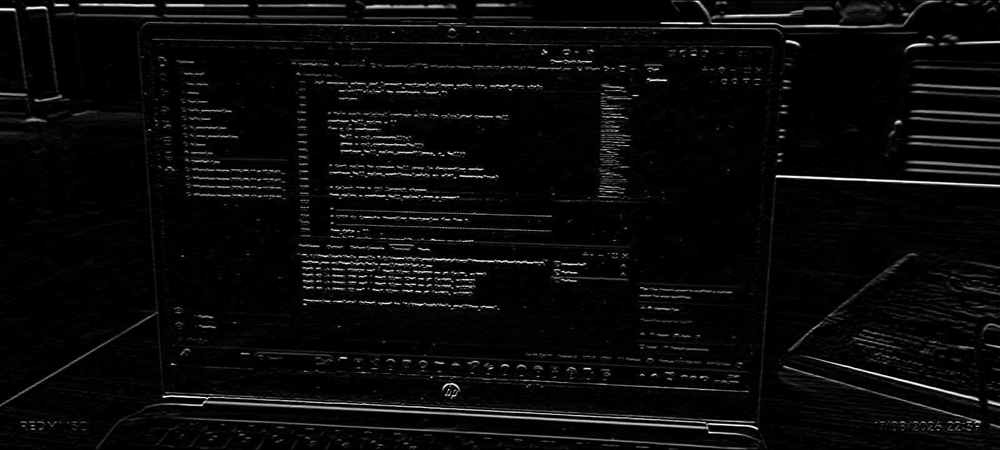

In [22]:
#USING FILTER2D
grey = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
blur_kernel = np.array([
    [1,2,1],
    [2,4,2],
    [1,2,1]
])/16
vert_edge_kernel = np.array([
    [1,0,-1],
    [1,0,-1],
    [1,0,-1]
])
horz_edge_kernel = np.array([
    [-1,-1,-1],
    [0,0,0],
    [1,1,1]
])
blur = cv.filter2D(grey,-1,blur_kernel)   #FILTER2D FOR CONVOLUTION WITH MANUAL KERNALS
vert_edge = cv.filter2D(grey,-1,vert_edge_kernel)
horz_edge = cv.filter2D(grey,-1,horz_edge_kernel)

#output
cv2_imshow(blur)
cv2_imshow(vert_edge)
cv2_imshow(horz_edge)

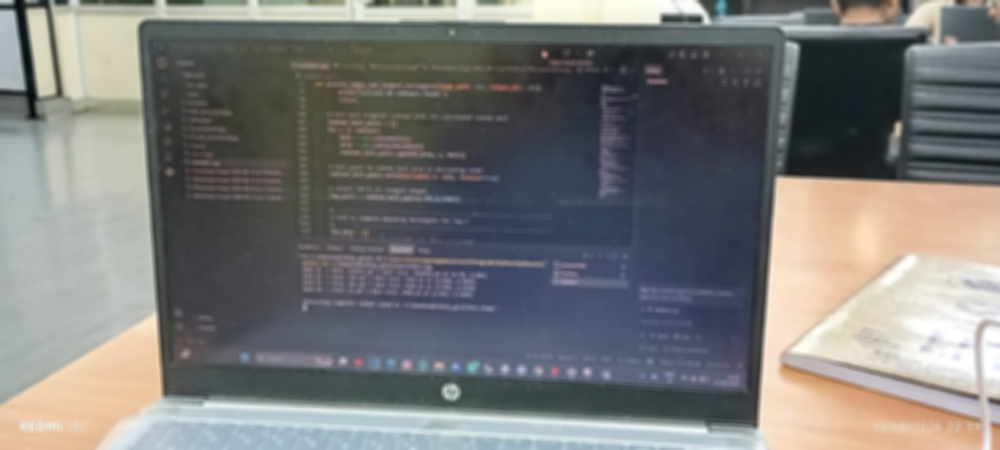

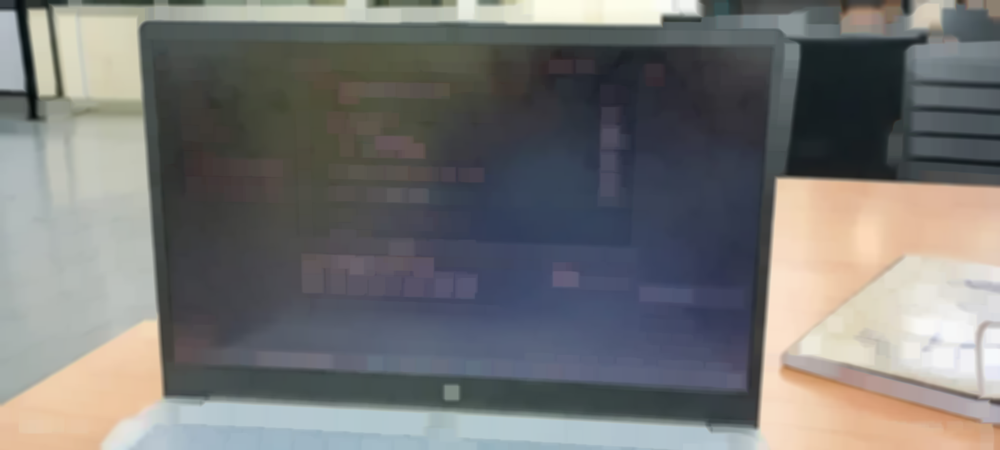

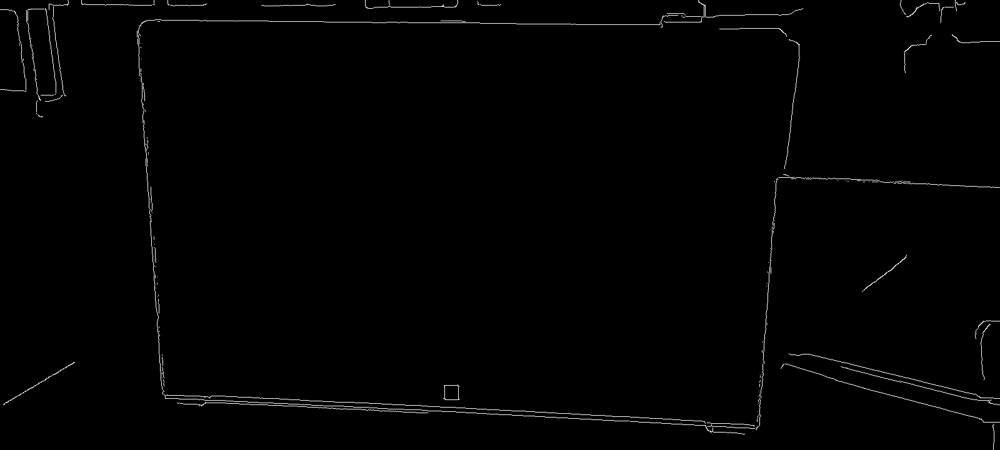

In [18]:
#NOISE REMOVAL THEN EDGE DETECTION USING CANNY EDGE-DETECTION TO GET SCREEN

grey = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
#blu = cv.GaussianBlur(img, (11, 11), 5)
blu = cv.blur(img, (9, 9));
cv2_imshow(blu)
element = cv.getStructuringElement(
    cv.MORPH_RECT,
    (20, 20),

)
blu = cv.erode(blu, element);
blu = cv.dilate(blu, element);
cv2_imshow(blu)
Edge = cv.Canny(blu, 50,120)
cv2_imshow(Edge)


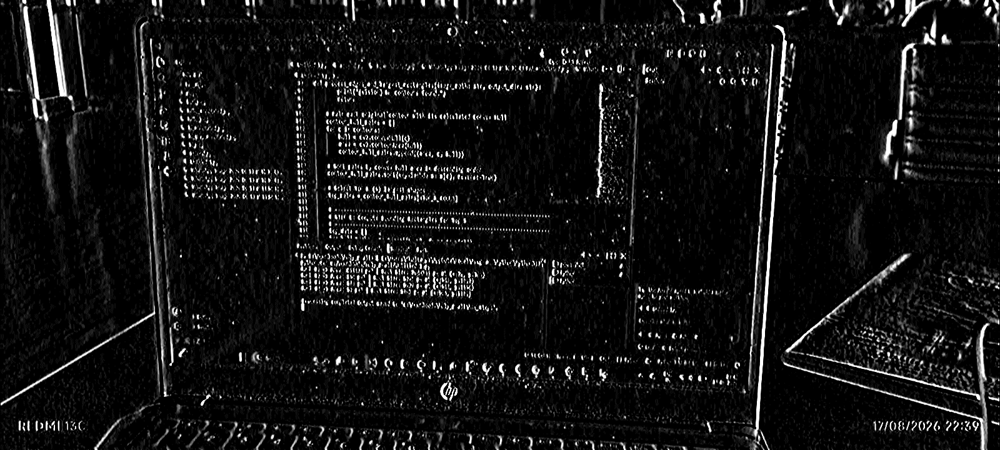

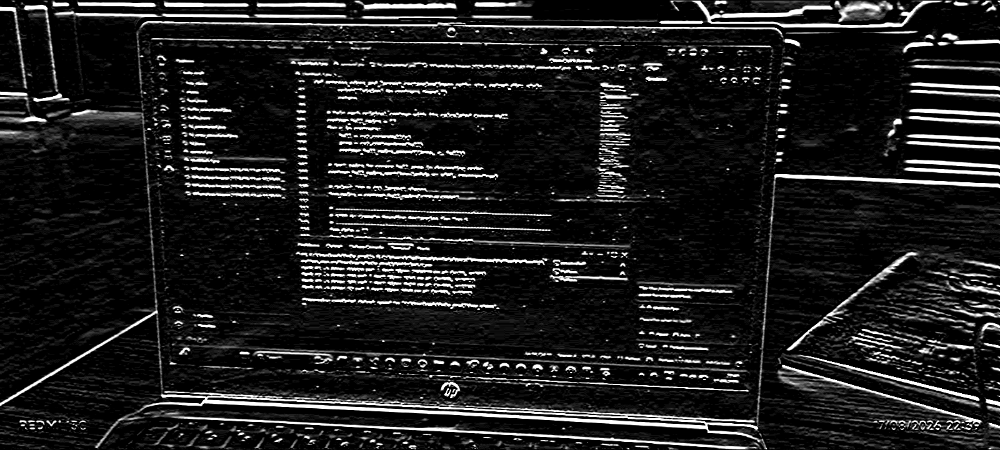

/tmp/ipykernel_714/126769738.py:8: RuntimeWarning: invalid value encountered in sqrt
  result = np.sqrt(np.square(dx) + np.square(dy))


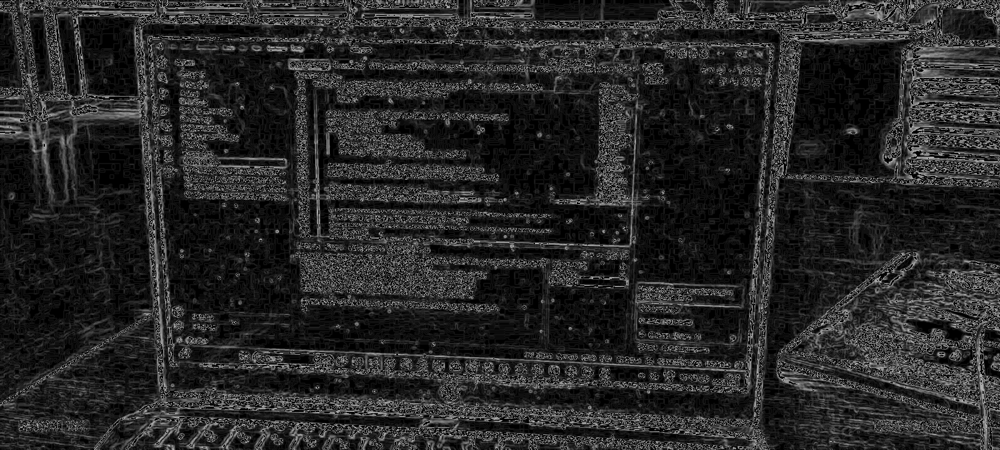

In [24]:
#USING SCHARR-GRADIENTS

dx = cv.Scharr(grey, cv.CV_16S, 1, 0);  #X-DERIVATIVE
cv2_imshow(dx)

dy = cv.Scharr(grey, cv.CV_16S, 0, 1)   #Y-DERIVATIVE
cv2_imshow(dy)
result = np.sqrt(np.square(dx) + np.square(dy)) #RESULTANT
result = cv.convertScaleAbs(result)
cv2_imshow(result)


In [5]:
img.shape

(721, 1600, 3)

/tmp/ipykernel_714/1439523017.py:4: RuntimeWarning: invalid value encountered in sqrt
  res = np.sqrt(np.square(x_img) + np.square(y_img))


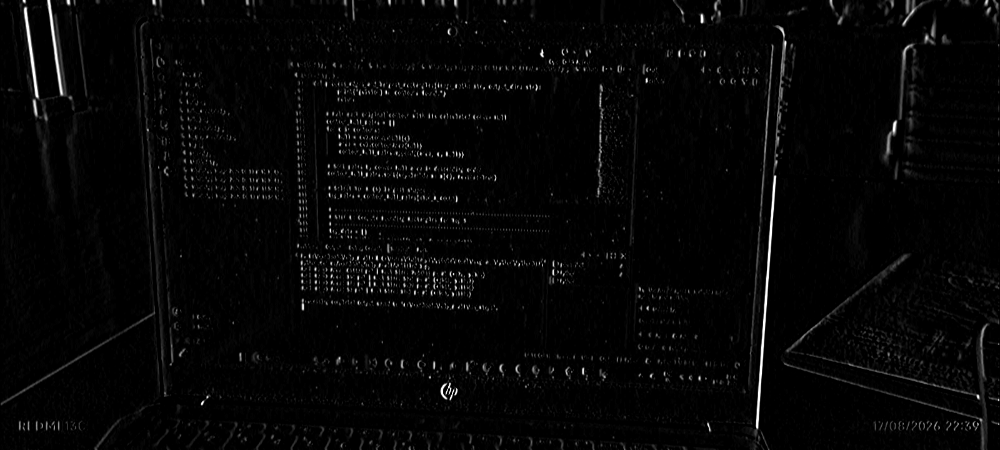

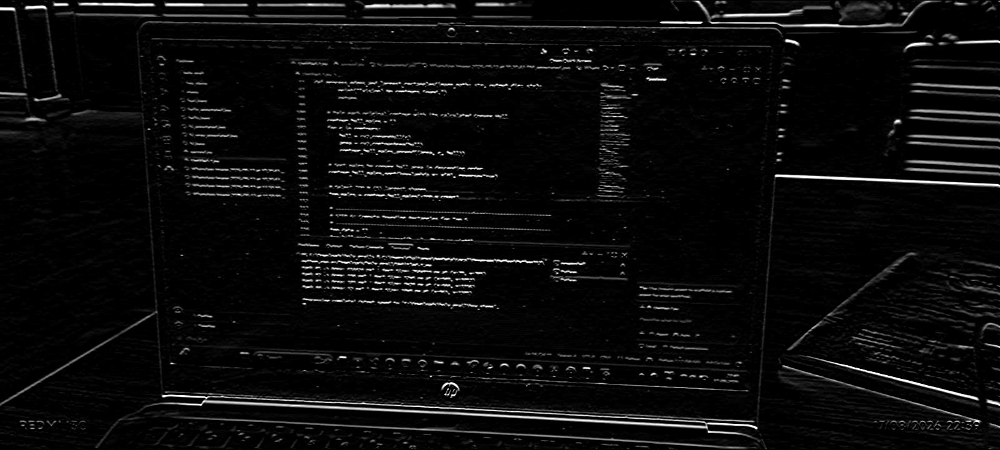

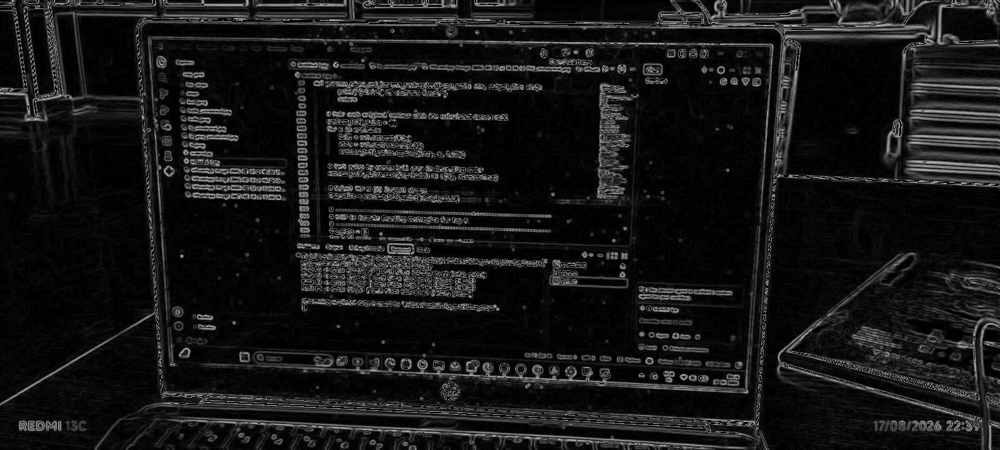

In [25]:
## Sobel derivatives
x_img = cv.Sobel(grey,  cv.CV_16S, 1, 0);  # x-derivative
y_img = cv.Sobel(grey,  cv.CV_16S, 0, 1);  # y-derivative
res = np.sqrt(np.square(x_img) + np.square(y_img))
res = cv.convertScaleAbs(res)
cv2_imshow(x_img)
cv2_imshow(y_img)
cv2_imshow(res)


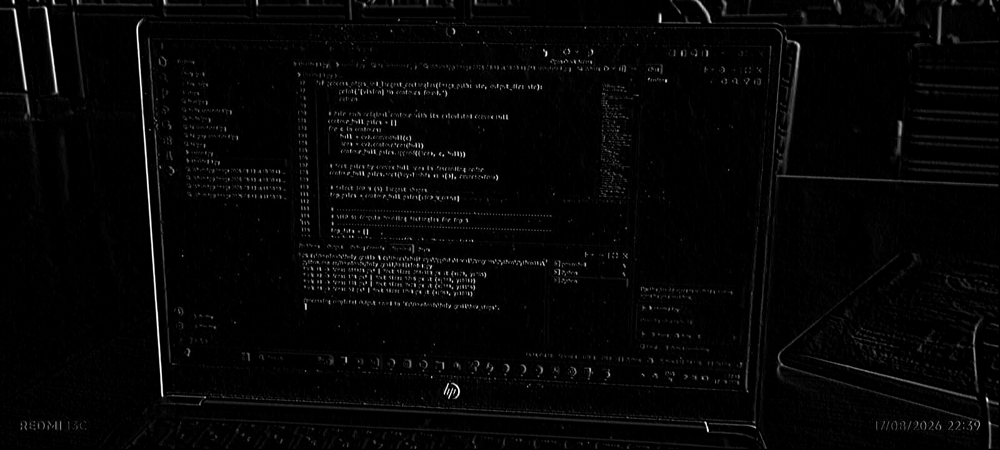

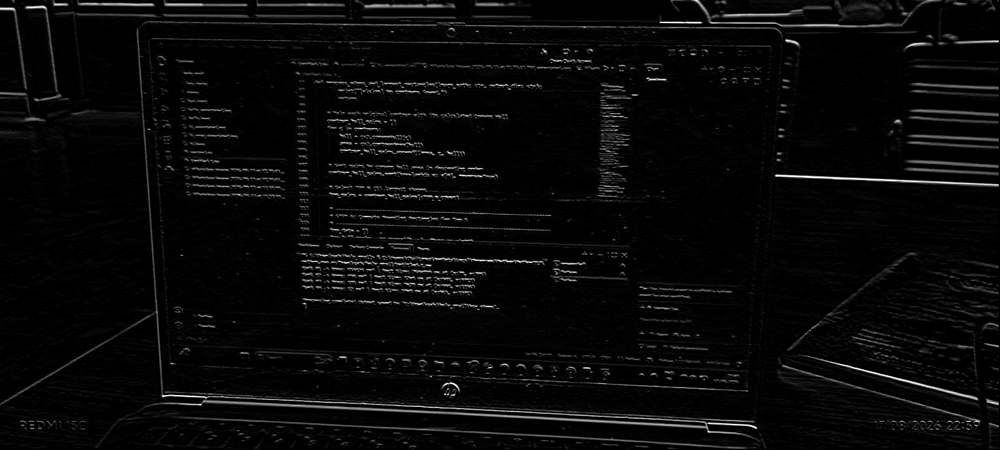

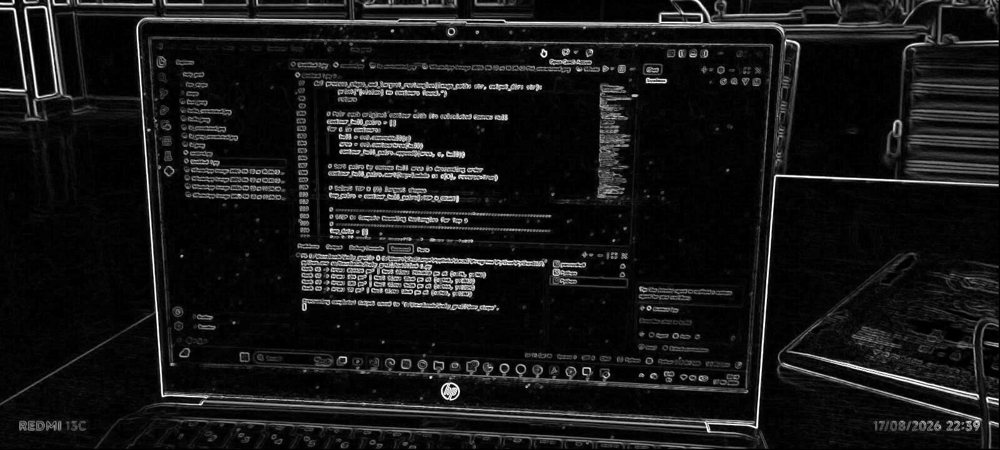

In [26]:
#MANUALLY WRITING CONVOLUTION CODE
blur_kernel = np.array([
    [1,2,1],
    [2,4,2],
    [1,2,1]                         # BLURS THE IMAGE
])/16
vert_edge_kernel = np.array([
    [1,0,-1],
    [1,0,-1],
    [1,0,-1]                        # VERTICAL EDGE DETECTION
])
horz_edge_kernel = np.array([
    [-1,-1,-1],                     # HORIZONTAL EDGE DETECTION
    [0,0,0],
    [1,1,1]
])
vert = np.zeros((img.shape[0], img.shape[1]))
horz = np.zeros((img.shape[0], img.shape[1]))
grey = cv.cvtColor(img, cv.COLOR_BGR2GRAY)


## LOOPS FOR CONVOLUTION
for i in range (grey.shape[0]-2):
  for j in range (grey.shape[1]-2):
    reg = grey[i:i+3, j:j+3]
    grey[i,j] = np.sum(reg* blur_kernel)
    vert[i,j] = np.sum(reg* vert_edge_kernel)
    horz[i,j] = np.sum(reg* horz_edge_kernel)

result = np.sqrt(np.square(vert) + np.square(horz))
result = cv.convertScaleAbs(result)
cv2_imshow(vert)
cv2_imshow(horz)
cv2_imshow(result)